<a href="https://colab.research.google.com/github/clgreco/procesamiento-de-imagenes/blob/main/Entrega_Procesmiento_de_Imagenes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [70]:
""""Ejercicio 1: Espacios de Color

Usando una imagen a color de su elección:

a) Cargar la imagen con OpenCV y mostrar los canales BGR por separado.
b) Identificar cuál de los tres canales tiene mayor información basándose en los valores promedio.
c) Convertir la imagen de BGR a RGB y explicar por qué los colores se ven diferentes antes y después de la conversión."""

'''Ejercicio 2: Muestreo y Cuantización


a) Aplicar muestreo espacial a una imagen con factores de 2, 4 y 8.
b) Para cada caso, calcular:
El nuevo tamaño de la imagen
El porcentaje de reducción de datos
c) Aplicar cuantización con 4 niveles diferentes (32, 64, 128, 256)
d) ¿En qué nivel de cuantización comienza a ser visible la degradación de la imagen?'''


'''Ejercicio 3: Segmentación por Color


Dada una imagen con objetos de diferentes colores:

a) Implementar una segmentación para extraer objetos de un color específico usando umbrales en los canales RGB.
b) Calcular y mostrar el histograma de la imagen en escala de grises.
c) Encontrar las coordenadas del rectángulo que encierra el objeto segmentado.
d) Dibujar los bordes del objeto segmentado en color rojo. '''


'Ejercicio 3: Segmentación por Color\n\n\nDada una imagen con objetos de diferentes colores:\n\na) Implementar una segmentación para extraer objetos de un color específico usando umbrales en los canales RGB.\nb) Calcular y mostrar el histograma de la imagen en escala de grises.\nc) Encontrar las coordenadas del rectángulo que encierra el objeto segmentado.\nd) Dibujar los bordes del objeto segmentado en color rojo. '

# Ejercicio 1


In [71]:
# Importamos las librerias
import os
import cv2
import numpy as np
from cv2 import imread
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

In [72]:
!wget https://previews.123rf.com/images/slowmotiongli/slowmotiongli2206/slowmotiongli220631818/188200082-loro-eclectus-macho-y-hembra-eclectus-roratus.jpg

--2025-04-14 22:25:25--  https://previews.123rf.com/images/slowmotiongli/slowmotiongli2206/slowmotiongli220631818/188200082-loro-eclectus-macho-y-hembra-eclectus-roratus.jpg
Resolving previews.123rf.com (previews.123rf.com)... 18.66.255.48, 18.66.255.87, 18.66.255.80, ...
Connecting to previews.123rf.com (previews.123rf.com)|18.66.255.48|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 302610 (296K) [image/jpeg]
Saving to: ‘188200082-loro-eclectus-macho-y-hembra-eclectus-roratus.jpg.2’

188200082-loro-ecle 100%[===================>] 295.52K  --.-KB/s    in 0.06s   

2025-04-14 22:25:25 (4.95 MB/s) - ‘188200082-loro-eclectus-macho-y-hembra-eclectus-roratus.jpg.2’ saved [302610/302610]



In [73]:
imagen_bgr = cv2.imread('188200082-loro-eclectus-macho-y-hembra-eclectus-roratus.jpg')

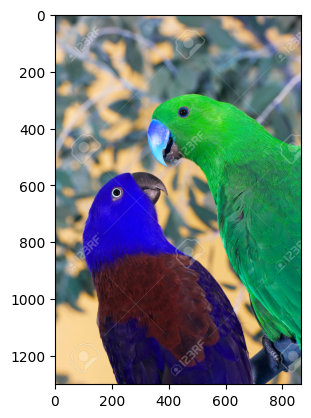

In [74]:
plt.imshow(imagen_bgr)
plt.show()

Las imagenes se ven diferentes porque OpenCV uriliza formate BGR por defecto

In [75]:
# Información básica de la imagen
print("Dimensiones de la imagen:", imagen_bgr.shape)
print("Tipo de datos:", imagen_bgr.dtype)
print("Tamaño en memoria (bytes):", imagen_bgr.nbytes)


Dimensiones de la imagen: (1300, 867, 3)
Tipo de datos: uint8
Tamaño en memoria (bytes): 3381300


##Análisis de Canales BGR
Cada canal representa la intensidad de un color específico:

Valores cercanos a 0 indican ausencia del color
Valores cercanos a 255 indican máxima intensidad

Estadísticas del canal Azul:
Valor mínimo: 0, Valor máximo: 255, Promedio: 97.57


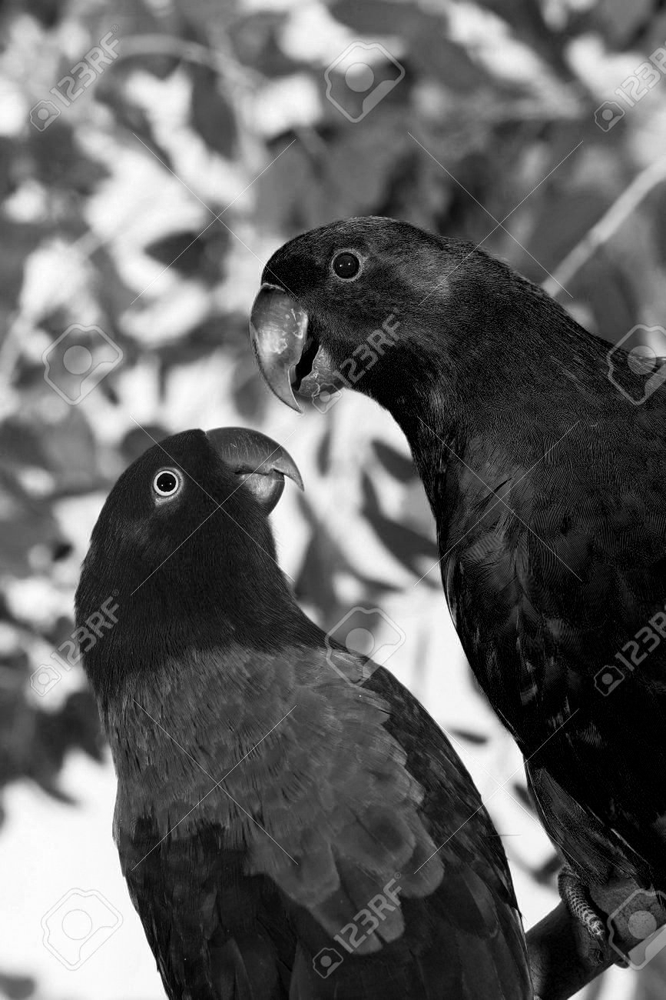

In [76]:
# Canal Azul (B)
B = imagen_bgr[:,:,0]
print("Estadísticas del canal Azul:")
print(f"Valor mínimo: {B.min()}, Valor máximo: {B.max()}, Promedio: {B.mean():.2f}")
cv2_imshow(B)


Estadísticas del canal Verde:
Valor mínimo: 0, Valor máximo: 255, Promedio: 116.03


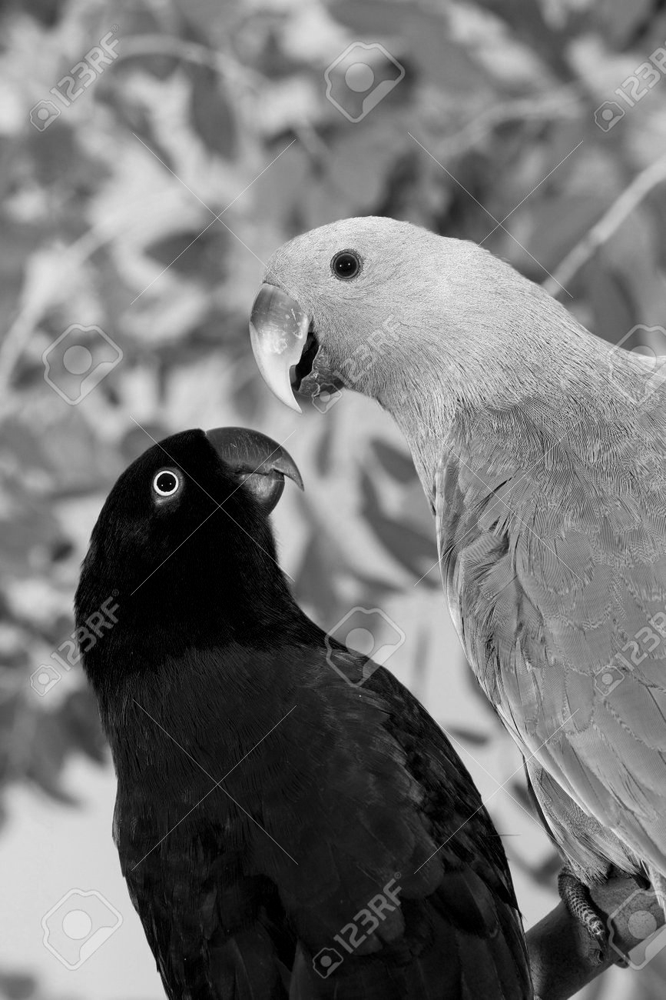

In [77]:
# Canal Verde (G)
G = imagen_bgr[:,:,1]
print("\nEstadísticas del canal Verde:")
print(f"Valor mínimo: {G.min()}, Valor máximo: {G.max()}, Promedio: {G.mean():.2f}")
cv2_imshow(G)


Estadísticas del canal Rojo:
Valor mínimo: 0, Valor máximo: 255, Promedio: 109.70


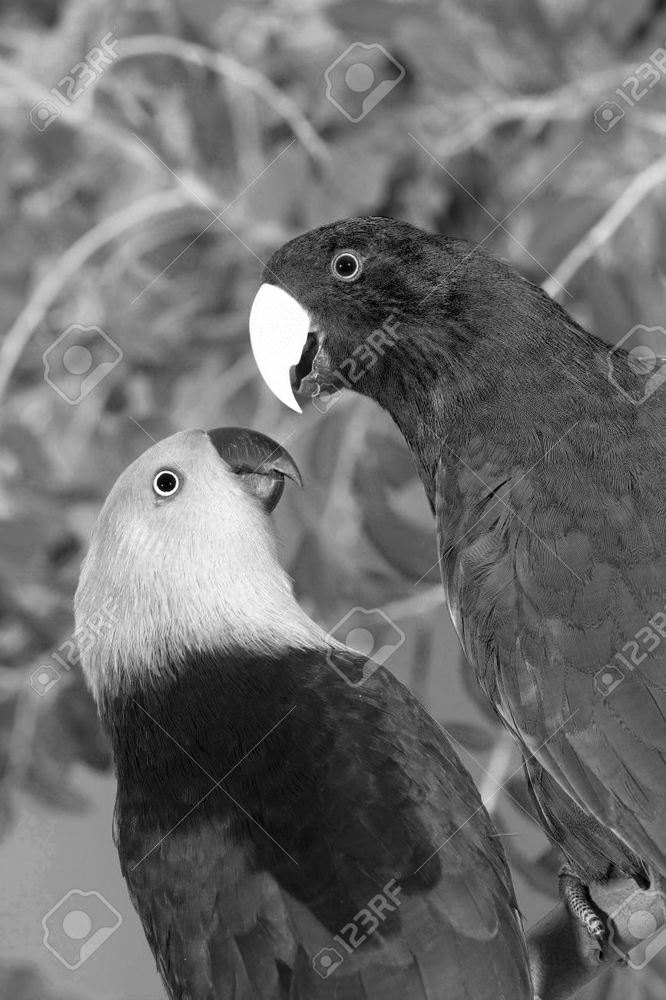

In [78]:
# Canal Rojo (R)
R = imagen_bgr[:,:,2]
print("\nEstadísticas del canal Rojo:")
print(f"Valor mínimo: {R.min()}, Valor máximo: {R.max()}, Promedio: {R.mean():.2f}")
cv2_imshow(R)

El canal con mas información es el canal Verde con un valor promedio de 116

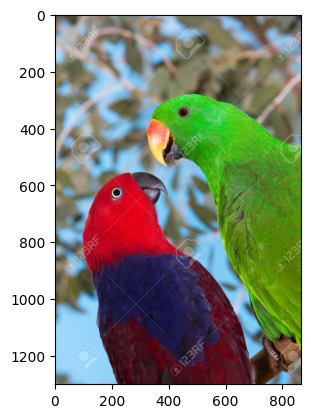

In [79]:
img = imagen_bgr[:,:,[2,1,0]]          # BGR a RGB
plt.imshow(img)
plt.show()

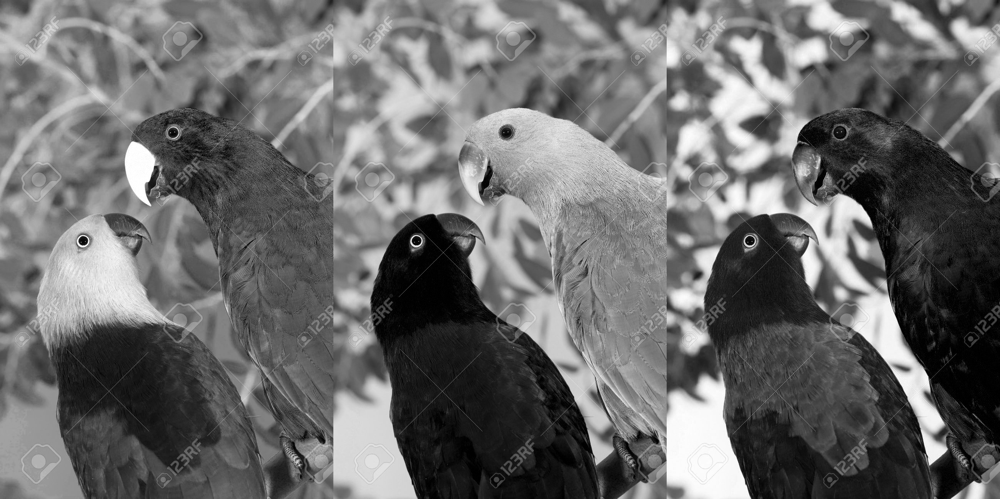

In [80]:
# Separación de canales de color
rojo = img[:,:,0]
verde = img[:,:,1]
azul = img[:,:,2]
canales = np.concatenate((rojo,verde,azul),axis=1)
cv2_imshow(canales)

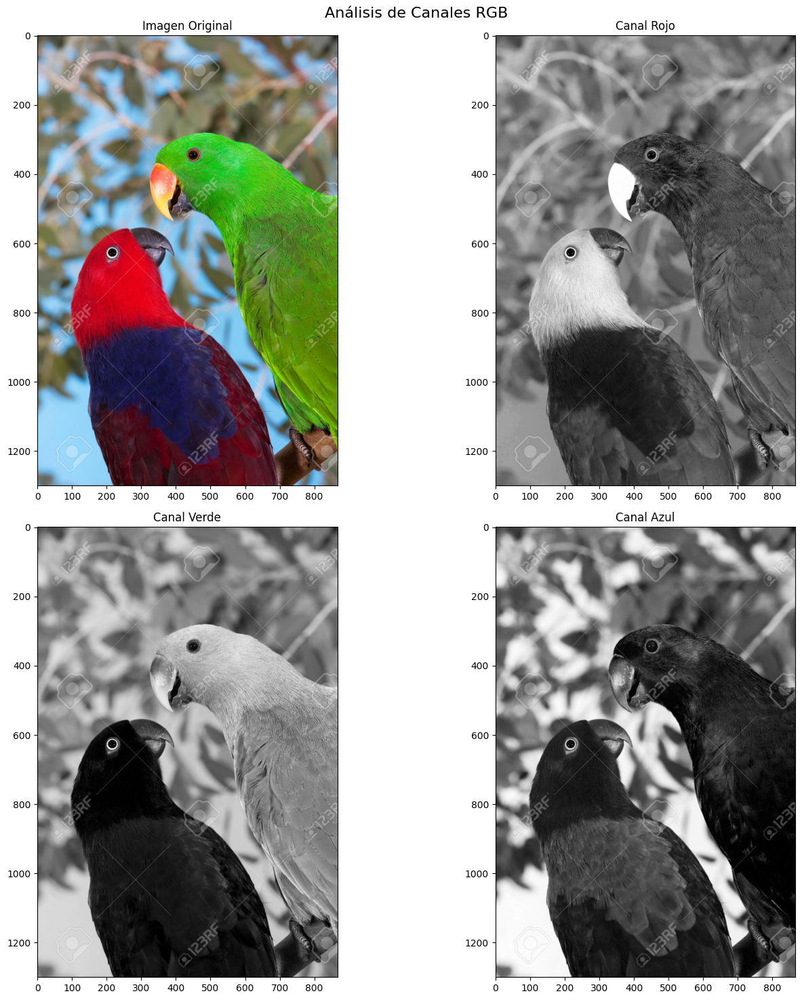

In [81]:
# Configuración de subplots
fig, axes = plt.subplots(2, 2, figsize=(15,15))
fig.suptitle('Análisis de Canales RGB', fontsize=16)

# Imagen Original
axes[0,0].imshow(img)
axes[0,0].set_title('Imagen Original')

# Canal Rojo
axes[0,1].imshow(img[:,:,0], cmap='gray')
axes[0,1].set_title('Canal Rojo')

# Canal Verde
axes[1,0].imshow(img[:,:,1], cmap='gray')
axes[1,0].set_title('Canal Verde')

# Canal Azul
axes[1,1].imshow(img[:,:,2], cmap='gray')
axes[1,1].set_title('Canal Azul')

plt.tight_layout()
plt.show()


# Ejercicio 2


In [82]:
# Muestra información básica de la imagen
def howis(img):
    print('Tamaño =', img.shape)     # Dimensiones de la matriz
    print('Máximo =', np.max(img))   # Valor más alto (más blanco)
    print('Mínimo =', np.min(img))   # Valor más bajo (más negro)

In [83]:
 X = img
 X = X[:,:,0] # Tomo solo el canal Rojo

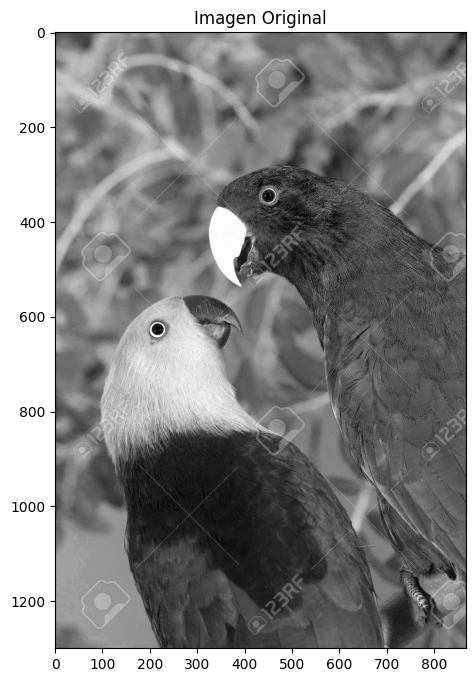

Tamaño = (1300, 867)
Máximo = 255
Mínimo = 0


In [84]:
# Muestra la imagen original
plt.figure(figsize=(8,8))   # Crea figura de 8x8 pulgadas
plt.imshow(X, cmap='gray')  # Muestra imagen en escala de grises
plt.title('Imagen Original')
plt.show()                  # Muestra la figura
howis(X)                    # Muestra información


## Muestreo espacial: Convertir una imagen continua en una matriz discreta de píxeles

El muestreo espacial reduce la resolución de una imagen tomando píxeles a intervalos regulares.

### Factor de Muestreo 2

In [85]:
d = 2   # Factor de muestreo: toma 1 pixel cada 'd' pixeles
(Nx,Mx) = X.shape          # Obtiene dimensiones de imagen original
ix = range(0,Nx,d)         # Crea secuencia de 0 a Nx saltando de d en d
jx = range(0,Mx,d)         # Igual para columnas
Ny = len(ix)               # Nueva altura = número de filas a tomar
My = len(jx)

In [86]:
# Crea nueva imagen muestreada
Y = np.zeros((Ny,My), np.uint8)  # Matriz vacía de enteros 0-255
for i in range(Ny):              # Para cada fila
    for j in range(My):          # Para cada columna
        Y[i,j] = X[ix[i],jx[j]]  # Copia el pixel correspondiente

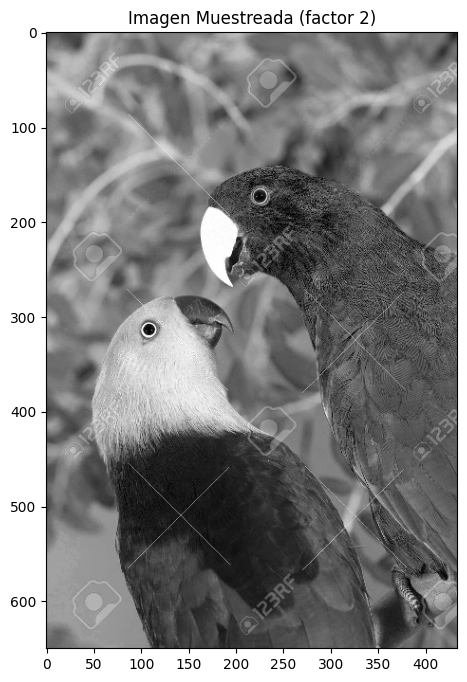

Tamaño = (650, 434)
Máximo = 255
Mínimo = 0
Resolución reducida de 1300x867 a 650x434 pixels


In [87]:
# Muestra imagen muestreada
plt.figure(figsize=(8,8))
plt.imshow(Y, cmap='gray')
plt.title(f'Imagen Muestreada (factor {d})')
plt.show()
howis(Y)
print(f'Resolución reducida de {Nx}x{Mx} a {Ny}x{My} pixels')

### Factor de Muestreo 4

In [88]:
d = 4   # Factor de muestreo: toma 1 pixel cada 'd' pixeles
(Nx,Mx) = X.shape          # Obtiene dimensiones de imagen original
ix = range(0,Nx,d)         # Crea secuencia de 0 a Nx saltando de d en d
jx = range(0,Mx,d)         # Igual para columnas
Ny = len(ix)               # Nueva altura = número de filas a tomar
My = len(jx)

In [89]:
# Crea nueva imagen muestreada
Y = np.zeros((Ny,My), np.uint8)  # Matriz vacía de enteros 0-255
for i in range(Ny):              # Para cada fila
    for j in range(My):          # Para cada columna
        Y[i,j] = X[ix[i],jx[j]]  # Copia el pixel correspondiente

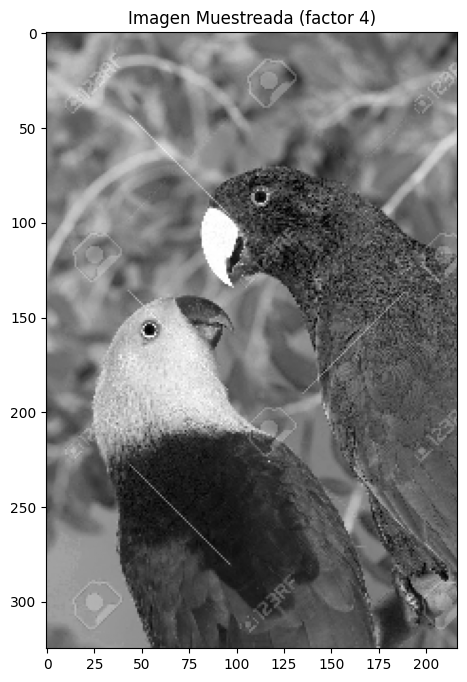

Tamaño = (325, 217)
Máximo = 255
Mínimo = 0
Resolución reducida de 1300x867 a 325x217 pixels


In [90]:
# Muestra imagen muestreada
plt.figure(figsize=(8,8))
plt.imshow(Y, cmap='gray')
plt.title(f'Imagen Muestreada (factor {d})')
plt.show()
howis(Y)
print(f'Resolución reducida de {Nx}x{Mx} a {Ny}x{My} pixels')

### Factor de Muestreo 8

In [91]:
d = 8   # Factor de muestreo: toma 1 pixel cada 'd' pixeles
(Nx,Mx) = X.shape          # Obtiene dimensiones de imagen original
ix = range(0,Nx,d)         # Crea secuencia de 0 a Nx saltando de d en d
jx = range(0,Mx,d)         # Igual para columnas
Ny = len(ix)               # Nueva altura = número de filas a tomar
My = len(jx)

In [92]:
# Crea nueva imagen muestreada
Y = np.zeros((Ny,My), np.uint8)  # Matriz vacía de enteros 0-255
for i in range(Ny):              # Para cada fila
    for j in range(My):          # Para cada columna
        Y[i,j] = X[ix[i],jx[j]]  # Copia el pixel correspondiente

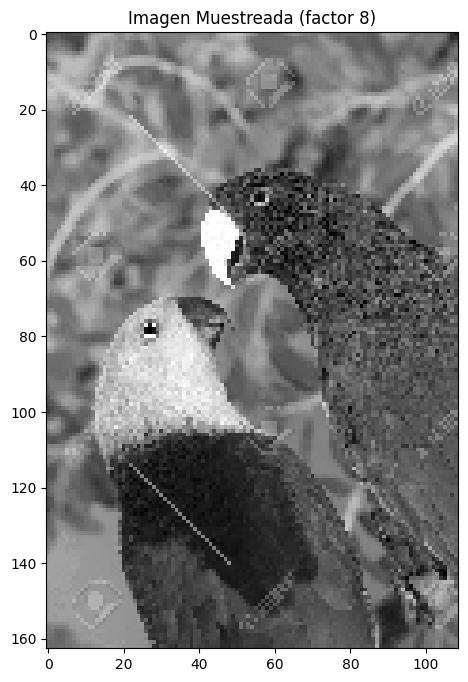

Tamaño = (163, 109)
Máximo = 255
Mínimo = 0
Resolución reducida de 1300x867 a 163x109 pixels


In [93]:
# Muestra imagen muestreada
plt.figure(figsize=(8,8))
plt.imshow(Y, cmap='gray')
plt.title(f'Imagen Muestreada (factor {d})')
plt.show()
howis(Y)
print(f'Resolución reducida de {Nx}x{Mx} a {Ny}x{My} pixels')

## Cuantización
 Aplicar cuantización con 4 niveles diferentes (32, 64, 128, 256)

### Nivel de Cuantización 32

In [111]:
q = 32                  # Factor de cuantización
# Divide por q, redondea hacia abajo y multiplica por q
Z = np.floor(X/q)*q      # Agrupa valores en intervalos de tamaño q
Z = Z.astype(np.uint8)   # Convierte a enteros 0-255

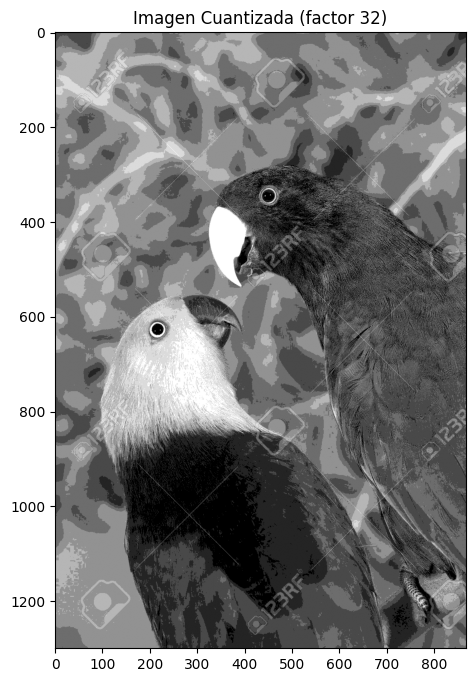

Tamaño = (1300, 867)
Máximo = 224
Mínimo = 0
Esta imagen tiene 8 niveles de gris (original: 256)


In [112]:
# Muestra imagen cuantizada
plt.figure(figsize=(8,8))
plt.imshow(Z, cmap='gray')
plt.title(f'Imagen Cuantizada (factor {q})')
plt.show()
howis(Z)
print(f'Esta imagen tiene {int(256/q)} niveles de gris (original: 256)')

### Nivel de Cuantización 64


In [113]:
q = 64                  # Factor de cuantización
# Divide por q, redondea hacia abajo y multiplica por q
Z = np.floor(X/q)*q      # Agrupa valores en intervalos de tamaño q
Z = Z.astype(np.uint8)   # Convierte a enteros 0-255

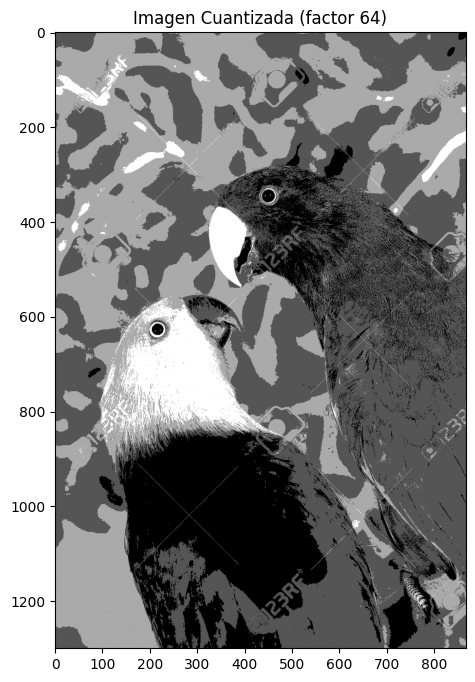

Tamaño = (1300, 867)
Máximo = 192
Mínimo = 0
Esta imagen tiene 4 niveles de gris (original: 256)


In [114]:
# Muestra imagen cuantizada
plt.figure(figsize=(8,8))
plt.imshow(Z, cmap='gray')
plt.title(f'Imagen Cuantizada (factor {q})')
plt.show()
howis(Z)
print(f'Esta imagen tiene {int(256/q)} niveles de gris (original: 256)')

### Nivel de cuantización 128


In [115]:
q = 128                 # Factor de cuantización
# Divide por q, redondea hacia abajo y multiplica por q
Z = np.floor(X/q)*q      # Agrupa valores en intervalos de tamaño q
Z = Z.astype(np.uint8)   # Convierte a enteros 0-255

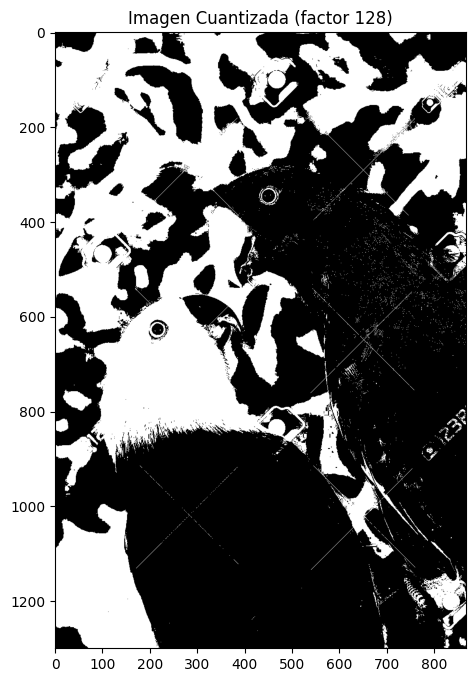

Tamaño = (1300, 867)
Máximo = 128
Mínimo = 0
Esta imagen tiene 2 niveles de gris (original: 256)


In [116]:
# Muestra imagen cuantizada
plt.figure(figsize=(8,8))
plt.imshow(Z, cmap='gray')
plt.title(f'Imagen Cuantizada (factor {q})')
plt.show()
howis(Z)
print(f'Esta imagen tiene {int(256/q)} niveles de gris (original: 256)')

### Nivel de cuantización 256

In [117]:
q = 256                  # Factor de cuantización
# Divide por q, redondea hacia abajo y multiplica por q
Z = np.floor(X/q)*q      # Agrupa valores en intervalos de tamaño q
Z = Z.astype(np.uint8)   # Convierte a enteros 0-255

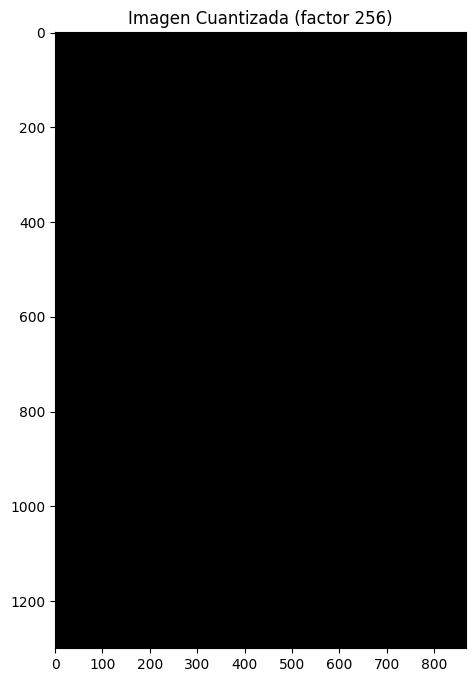

Tamaño = (1300, 867)
Máximo = 0
Mínimo = 0
Esta imagen tiene 1 niveles de gris (original: 256)


In [118]:
# Muestra imagen cuantizada
plt.figure(figsize=(8,8))
plt.imshow(Z, cmap='gray')
plt.title(f'Imagen Cuantizada (factor {q})')
plt.show()
howis(Z)
print(f'Esta imagen tiene {int(256/q)} niveles de gris (original: 256)')

A partir del nivel de cuantización 64 ya es perceptible cierta pérdida de detalle, especialmente en zonas de transición. Con 32 niveles es claramente visible la degradación (bandas, zonas planas), mientras que con 128 y 256 se mantiene buena calidad.


# Ejercicio 3

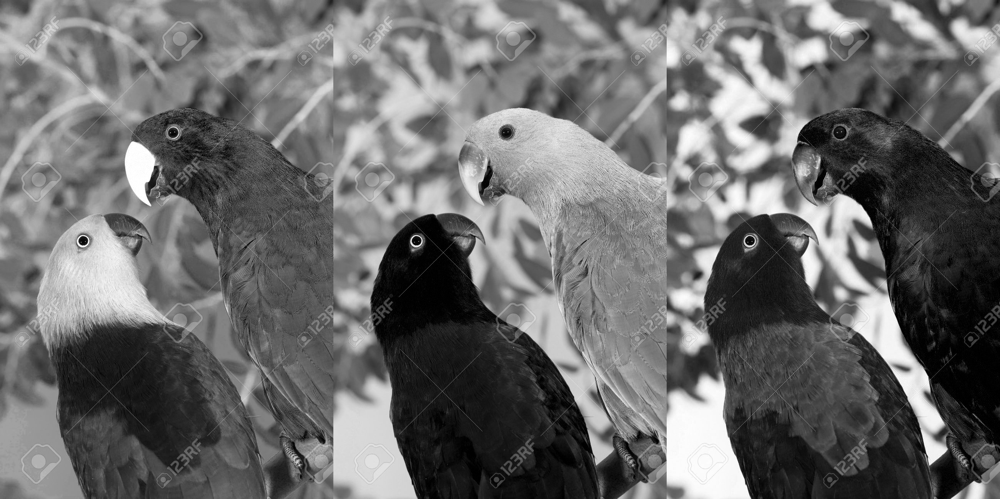

In [102]:
# Separación de canales de color
rojo = img[:,:,0]
verde = img[:,:,1]
azul = img[:,:,2]
canales = np.concatenate((rojo,verde,azul),axis=1)
cv2_imshow(canales)

Tamaño = (1300, 867)
Máximo = 252
Mínimo = 0


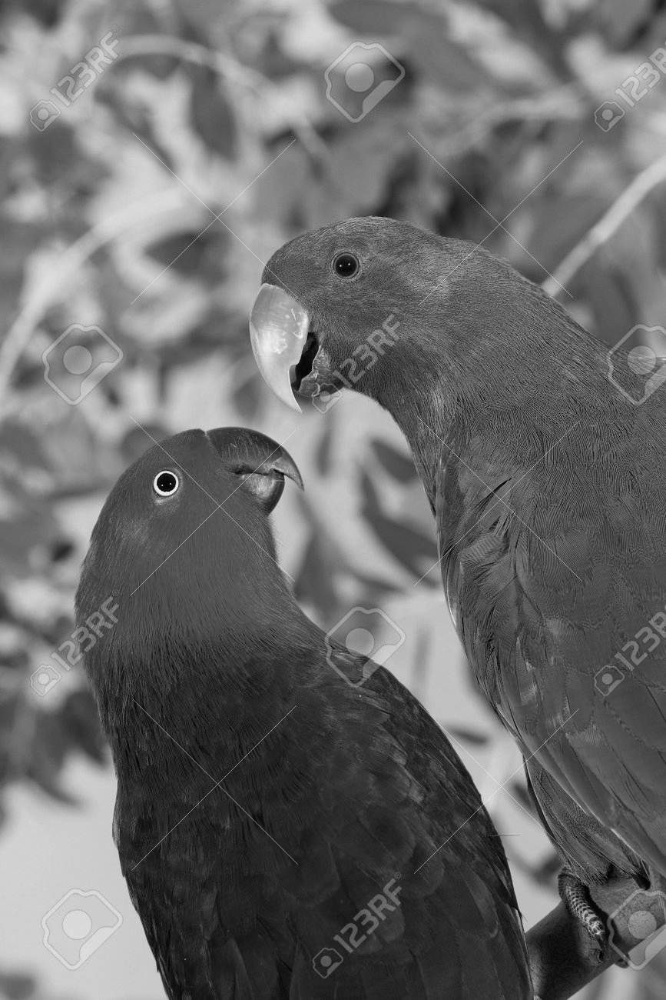

In [103]:
# Conversión a escala de grises
rojo_f = rojo.astype(float)
verde_f = verde.astype(float)
azul_f = azul.astype(float)
# Promedio ponderado
peso = (1/3,1/3,1/3)
#peso = (0.1,0.4,0.5)  # pesos alternativos
gris_f = peso[0]*rojo_f + peso[1]*verde_f + peso[2]*azul_f
gris = gris_f.astype(int)

howis(gris)
cv2_imshow(gris)

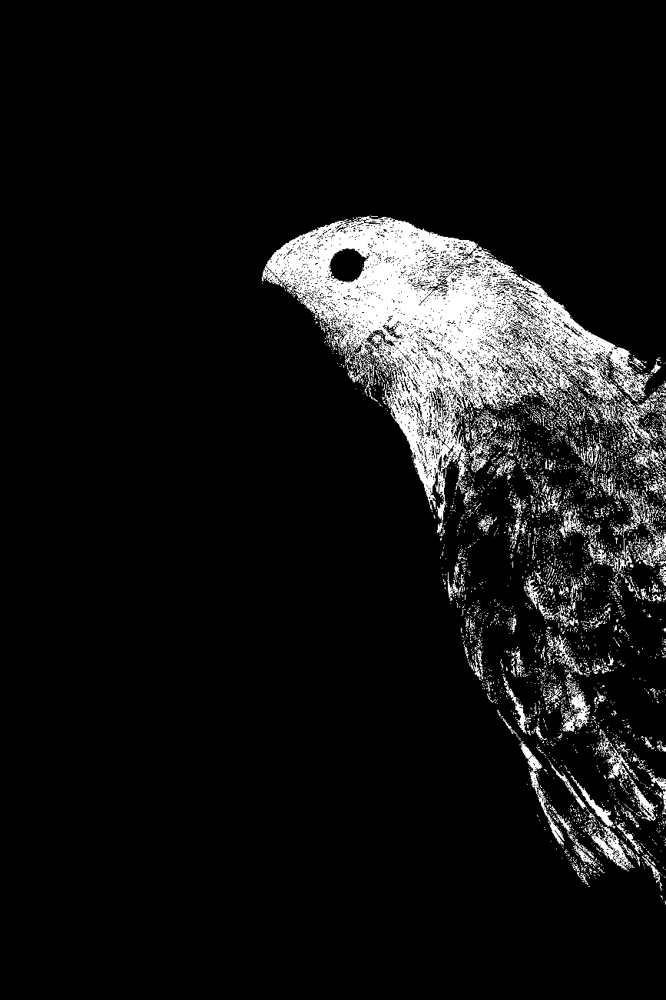

In [104]:

# Segmentación por color: loro verde
seg_v = verde > 140
seg_r = rojo < 100
seg_a = azul < 120
mascara = np.logical_and(np.logical_and(seg_v, seg_r), seg_a)


cv2_imshow(mascara.astype(np.uint8)*255)

In [105]:
# Función para mostrar histograma
def histograma(X):
    (N,M) = X.shape
    n = 256
    h = np.zeros((256,))
    for i in range(N):
        for j in range(M):
            x = X[i,j]
            h[x] = h[x]+1
    plt.plot(range(n),h[0:n])
    plt.title('Histograma')
    plt.xlabel('Valor de pixel')
    plt.ylabel('Frecuencia')
    plt.show()

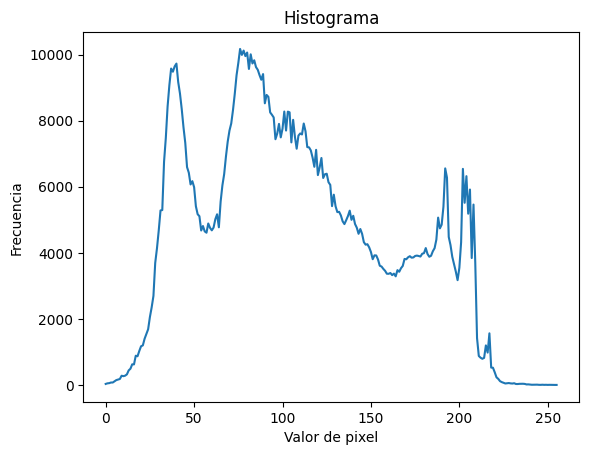

In [106]:
histograma(gris)

In [107]:
# Búsqueda de coordenadas del rectángulo
i_min = 1000
i_max = 0
j_min = 1000
j_max = 0
for i in range(N):
    for j in range(M):
        if limpia[i,j]>0:
            if i<i_min: i_min = i
            if i>i_max: i_max = i
            if j<j_min: j_min = j
            if j>j_max: j_max = j

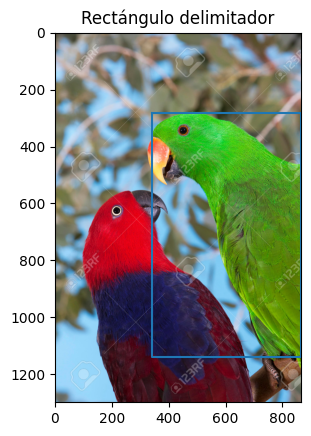

In [108]:
# Dibujo del rectángulo
y = [i_min,i_min,i_max,i_max,i_min]
x = [j_min,j_max,j_max,j_min,j_min]
plt.imshow(img)
plt.plot(x,y)
plt.title('Rectángulo delimitador')
plt.show()

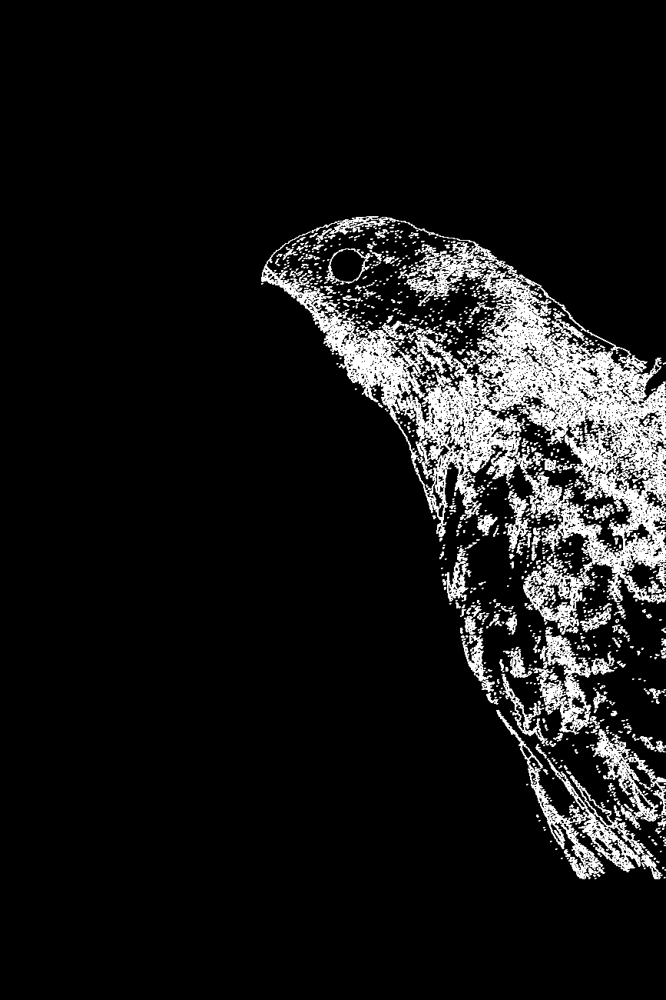

In [109]:
# Detección de bordes
borde = np.zeros((N,M),np.uint8)
# Bordes horizontales
for i in range(N):
    for j in range(1,M):
        if limpia[i,j]!=limpia[i,j-1]:
            borde[i,j] = 1
            borde[i,j-1] = 1
# Bordes verticales
for i in range(1,N):
    for j in range(M):
        if limpia[i-1,j]!=limpia[i,j]:
            borde[i,j] = 1
            borde[i,j-1] = 1
cv2_imshow(borde*255)

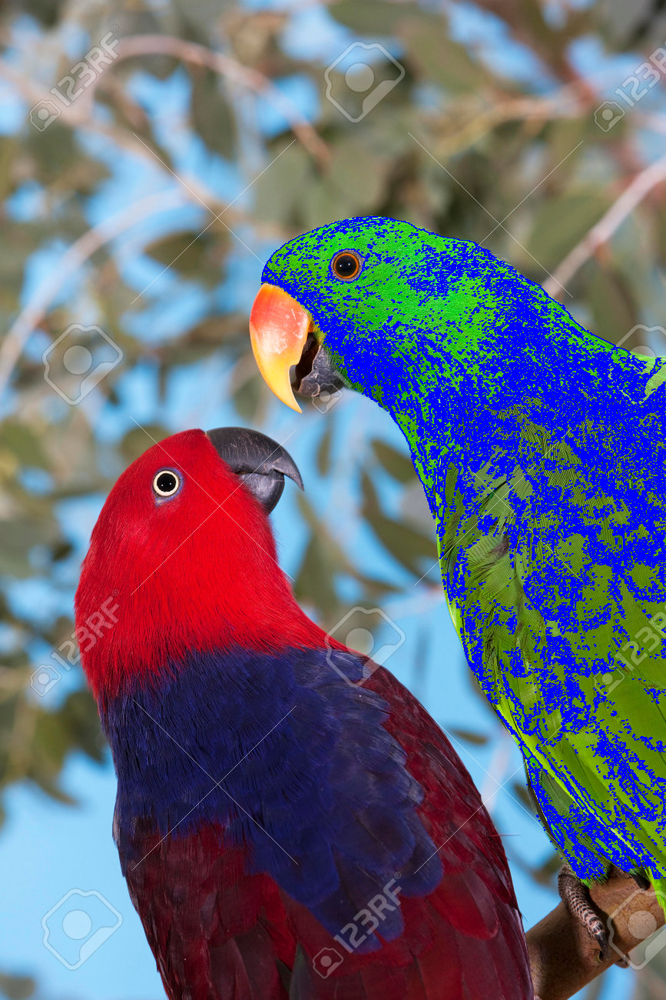

In [110]:
# Resultado final con bordes
img_final = img_cv.copy()
for i in range(N):
    for j in range(M):
        if borde[i,j]==1:
            img_final[i,j,:] = [255,0,0]
cv2_imshow(img_final)